In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from tensorflow import keras
from keras.applications import ResNet50
from keras.models import Sequential
from keras.layers import Dense, Flatten, Dropout
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.preprocessing import MinMaxScaler, LabelEncoder
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import cv2
import os
from PIL import Image
from google.colab.patches import cv2_imshow
import zipfile
import matplotlib.image as mpimg
from tensorflow.keras import layers, models
import keras
from keras.models import Sequential, Model
from keras.layers import Conv2D, MaxPool2D
from keras.layers import Activation, Dropout, BatchNormalization, Flatten, Dense
from keras.optimizers import Adam
from keras.utils import to_categorical
import pickle

In [ ]:
# !pip install -q datasets

In [ ]:
# from datasets import load_dataset

# dataset = load_dataset("naver-clova-ix/cord-v2")

README.md:   0%|          | 0.00/27.0 [00:00<?, ?B/s]

dataset_infos.json:   0%|          | 0.00/1.05k [00:00<?, ?B/s]

data/train-00000-of-00004-b4aaeceff1d90e(…): reconstructing file:   0%|          |  0.00B /  490MB            

data/train-00000-of-00004-b4aaeceff1d90e(…): downloading bytes:           |  0.00B            

data/train-00001-of-00004-7dbbe248962764(…): reconstructing file:   0%|          |  0.00B /  441MB            

data/train-00001-of-00004-7dbbe248962764(…): downloading bytes:           |  0.00B            

data/train-00002-of-00004-688fe1305a55e5(…): reconstructing file:   0%|          |  0.00B /  444MB            

data/train-00002-of-00004-688fe1305a55e5(…): downloading bytes:           |  0.00B            

data/train-00003-of-00004-2d0cd200555ed7(…): reconstructing file:   0%|          |  0.00B /  456MB            

data/train-00003-of-00004-2d0cd200555ed7(…): downloading bytes:           |  0.00B            

data/validation-00000-of-00001-cc3c5779f(…): reconstructing file:   0%|          |  0.00B /  242MB            

data/validation-00000-of-00001-cc3c5779f(…): downloading bytes:           |  0.00B            

data/test-00000-of-00001-9c204eb3f4e1179(…): reconstructing file:   0%|          |  0.00B /  234MB            

data/test-00000-of-00001-9c204eb3f4e1179(…): downloading bytes:           |  0.00B            

Generating train split:   0%|          | 0/800 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/100 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/100 [00:00<?, ? examples/s]

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

# dataset.save_to_disk('/content/drive/MyDrive/cord_v2_dataset')

Mounted at /content/drive


Saving the dataset (0/4 shards):   0%|          | 0/800 [00:00<?, ? examples/s]

Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

In [ ]:
# from datasets import load_from_disk
# dataset = load_from_disk('/content/drive/MyDrive/cord_v2_dataset')

In [ ]:
# dataset = load_dataset("naver-clova-ix/cord-v2", trust_remote_code=True)

In [ ]:
!pip install -q datasets   # still needed each fresh session — Colab wipes installed packages too

from google.colab import drive
drive.mount('/content/drive')

from datasets import load_from_disk
dataset = load_from_disk('/content/drive/MyDrive/cord_v2_dataset')

Mounted at /content/drive


In [ ]:
print(dataset)

DatasetDict({
    train: Dataset({
        features: ['image', 'ground_truth'],
        num_rows: 800
    })
    validation: Dataset({
        features: ['image', 'ground_truth'],
        num_rows: 100
    })
    test: Dataset({
        features: ['image', 'ground_truth'],
        num_rows: 100
    })
})


dict_keys(['image', 'ground_truth'])
{"gt_parse": {"menu": [{"nm": "Nasi Campur Bali", "cnt": "1 x", "price": "75,000"}, {"nm": "Bbk Bengil Nasi", "cnt": "1 x", "price": "125,000"}, {"nm": "MilkShake Starwb", "cnt": "1 x", "price": "37,000"}, {"nm": "Ice Lemon Tea", "cnt": "1 x", "price": "24,000"}, {"nm": "Nasi Ayam Dewata", "cnt": "1 x", "price": "70,000"}, {"nm": "Free Ice Tea", "cnt": "3 x", "price": "0"}, {"nm": "Organic Green Sa", "cnt": "1 x", "price": "65,000"}, {"nm": "Ice Tea", "cnt": "1 x", "price": "18,000"}, {"nm": "Ice Orange", "cnt": "1 x", "price": "29,000"}, {"nm": "Ayam Suir Bali", "cnt": "1 x", "price": "85,000"}, {"nm": "Tahu Goreng", "cnt": "2 x", "price": "36,000"}, {"nm": "Tempe Goreng", "cnt": "2 x", "price": "36,000"}, {"nm": "Tahu Telor Asin", "cnt": "1 x", "price": "40,000."}, {"nm": "Nasi Goreng Samb", "cnt": "1 x", "price": "70,000"}, {"nm": "Bbk Panggang Sam", "cnt": "3 x", "price": "366,000"}, {"nm": "Ayam Sambal Hija", "cnt": "1 x", "price": "92,000"}, {

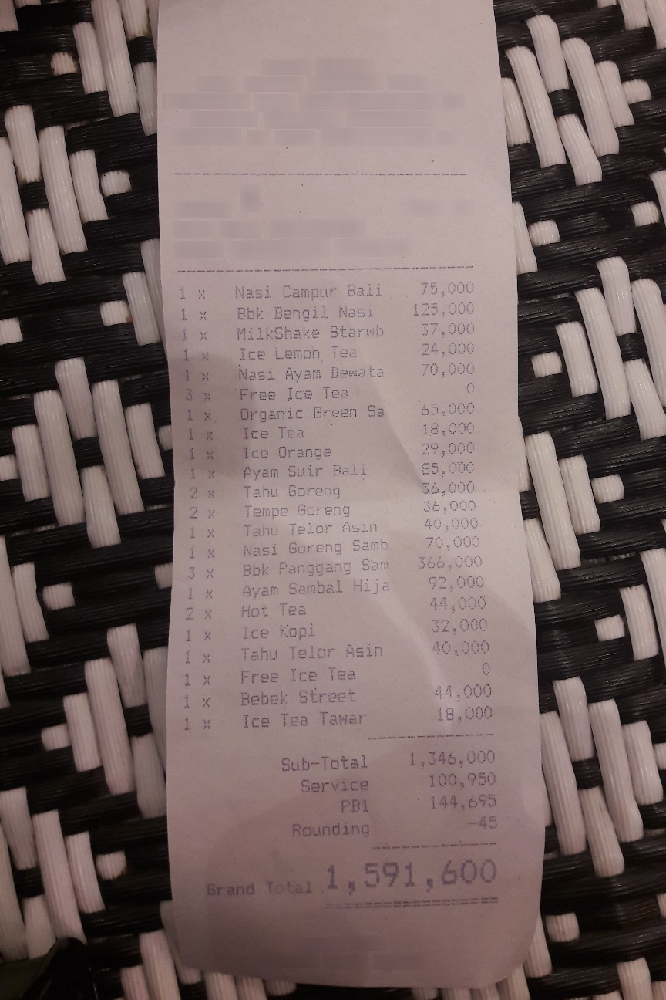

In [ ]:
sample = dataset['train'][0]
print(sample.keys())        # see the fields available
print(sample['ground_truth'])  # the structured JSON label
sample['image']              # this will just display the image in Colab

dict_keys(['image', 'ground_truth'])
{"gt_parse": {"menu": {"nm": "Viet Milk Coffee", "cnt": "1", "price": "25.000", "sub": [{"nm": "+Hot"}, {"nm": "+M"}]}, "sub_total": {"subtotal_price": "25.000"}, "total": {"total_price": "25.000", "cashprice": "30.000", "changeprice": "5.000"}}, "meta": {"version": "2.0.0", "split": "train", "image_id": 10, "image_size": {"width": 432, "height": 648}}, "valid_line": [{"words": [{"quad": {"x2": 170, "y3": 231, "x3": 171, "y4": 232, "x1": 162, "y1": 218, "x4": 162, "y2": 219}, "is_key": 0, "row_id": 1827478, "text": "1"}], "category": "menu.cnt", "group_id": 3, "sub_group_id": 0}, {"words": [{"quad": {"x2": 192, "y3": 232, "x3": 192, "y4": 232, "x1": 171, "y1": 218, "x4": 172, "y2": 218}, "is_key": 0, "row_id": 1827478, "text": "Viet"}, {"quad": {"x2": 218, "y3": 232, "x3": 217, "y4": 232, "x1": 192, "y1": 220, "x4": 192, "y2": 220}, "is_key": 0, "row_id": 1827478, "text": "Milk"}, {"quad": {"x2": 248, "y3": 234, "x3": 248, "y4": 234, "x1": 218, "y1"

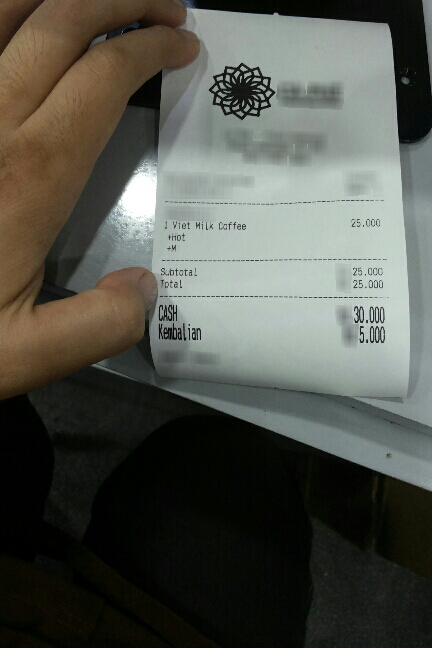

In [ ]:
sample = dataset['train'][10]
print(sample.keys())
print(sample['ground_truth'])
sample['image']

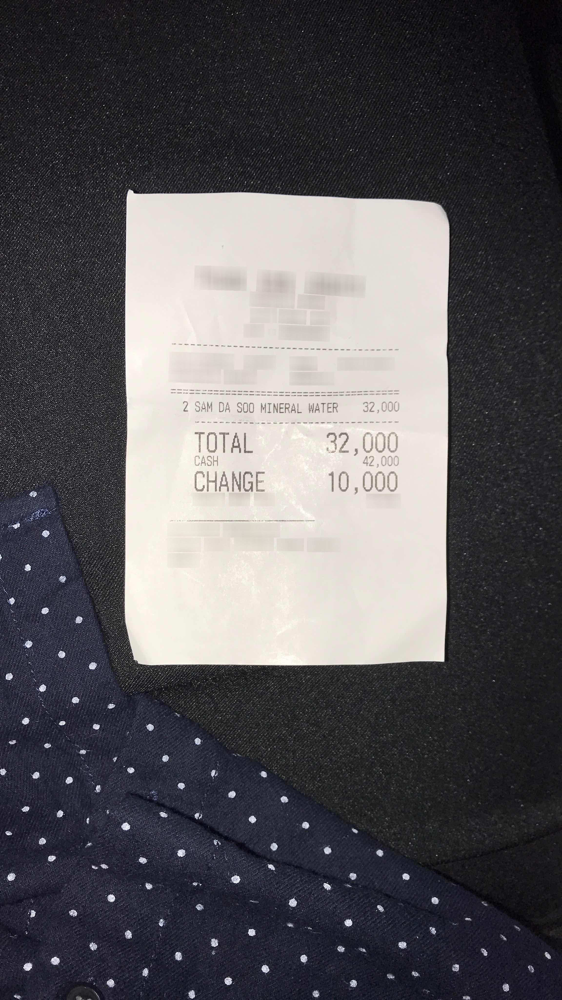

In [ ]:
import json

sample = dataset['train'][100]
gt = json.loads(sample['ground_truth'])
sample['image']

In [ ]:
import json
print(json.dumps(gt, indent=2, ensure_ascii=False))

{
  "gt_parse": {
    "menu": {
      "nm": "SAM DA SOO MINERAL WATER",
      "cnt": "2",
      "price": "32,000"
    },
    "total": {
      "total_price": "32,000",
      "cashprice": "42,000",
      "changeprice": "10,000"
    }
  },
  "meta": {
    "version": "2.0.0",
    "split": "train",
    "image_id": 100,
    "image_size": {
      "width": 2304,
      "height": 4096
    }
  },
  "valid_line": [
    {
      "words": [
        {
          "quad": {
            "x2": 780,
            "y3": 1693,
            "x3": 780,
            "y4": 1693,
            "x1": 742,
            "y1": 1638,
            "x4": 742,
            "y2": 1638
          },
          "is_key": 0,
          "row_id": 2101089,
          "text": "2"
        }
      ],
      "category": "menu.cnt",
      "group_id": 3,
      "sub_group_id": 0
    },
    {
      "words": [
        {
          "quad": {
            "x2": 878,
            "y3": 1693,
            "x3": 878,
            "y4": 1693,
            "x1": 

In [ ]:
menu_items = gt['gt_parse']['menu']
if isinstance(menu_items, dict):
    menu_items = [menu_items]
df = pd.DataFrame(menu_items)
df

,nm,cnt,price
0,SAM DA SOO MINERAL WATER,2,"32,000"


In [ ]:
for split in dataset.keys():
    print(f"{split}: {len(dataset[split])} samples")

train: 800 samples
validation: 100 samples
test: 100 samples


In [ ]:
widths, heights = [], []
for i in range(len(dataset['train'])):
    img = dataset['train'][i]['image']
    widths.append(img.width)
    heights.append(img.height)

df_dims = pd.DataFrame({'width': widths, 'height': heights})
print(df_dims.describe())

             width       height
count   800.000000   800.000000
mean    997.076250  1573.306250
std     544.511981   993.639747
min     204.000000   364.000000
25%     576.000000   864.000000
50%     864.000000  1296.000000
75%    1080.000000  1478.000000
max    3024.000000  4224.000000


In [ ]:
modes = [dataset['train'][i]['image'].mode for i in range(len(dataset['train']))]
pd.Series(modes).value_counts()

,count
RGB,800


In [ ]:
import io

sizes_kb = []
for i in range(len(dataset['train'])):
    img = dataset['train'][i]['image']
    buf = io.BytesIO()
    img.save(buf, format='PNG')
    sizes_kb.append(len(buf.getvalue()) / 1024)

pd.Series(sizes_kb).describe()

,0
count,800.000000
mean,1581.185031
std,1525.266703
min,64.000000
25%,712.555664
50%,1151.236328
75%,1536.723633
max,10457.793945


In [ ]:
import json

item_counts = []
for i in range(len(dataset['train'])):
    gt = json.loads(dataset['train'][i]['ground_truth'])
    menu = gt['gt_parse'].get('menu', [])
    if isinstance(menu, dict):
        menu = [menu]
    item_counts.append(len(menu))

pd.Series(item_counts).describe()

,0
count,800.000000
mean,2.631250
std,2.576543
min,1.000000
25%,1.000000
50%,2.000000
75%,3.000000
max,22.000000


In [ ]:
!pip install -q datasets

from google.colab import drive
drive.mount('/content/drive')

from datasets import load_from_disk
dataset = load_from_disk('/content/drive/MyDrive/cord_v2_dataset')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import json
all_keys = set()
for i in range(len(dataset['train'])):
    gt = json.loads(dataset['train'][i]['ground_truth'])
    all_keys.update(gt.keys())
    all_keys.update(gt.get('gt_parse', {}).keys())

print(all_keys)

{'repeating_symbol', 'valid_line', 'dontcare', 'roi', 'gt_parse', 'menu', 'void_menu', 'total', 'sub_total', 'meta'}


In [ ]:
# processor = DonutProcessor.from_pretrained("naver-clova-ix/donut-base")
# model = VisionEncoderDecoderModel.from_pretrained("naver-clova-ix/donut-base")

# processor.tokenizer.add_special_tokens({"additional_special_tokens": list(all_tags)})
# model.decoder.resize_token_embeddings(len(processor.tokenizer))

# # VERIFY immediately, before doing anything else
# test_id = processor.tokenizer.convert_tokens_to_ids("<s_cnt>")
# print(test_id, "vs unk id:", processor.tokenizer.unk_token_id)
# assert test_id != processor.tokenizer.unk_token_id, "Special token not registered!"

Loading weights:   0%|          | 0/484 [00:00<?, ?it/s]

57630 vs unk id: 3


In [ ]:
from transformers import DonutProcessor, VisionEncoderDecoderModel

processor = DonutProcessor.from_pretrained("naver-clova-ix/donut-base")
processor.image_processor.size = {"height": 1280, "width": 960}   # <-- the resize, easy to forget

model = VisionEncoderDecoderModel.from_pretrained("naver-clova-ix/donut-base")

processor.tokenizer.add_special_tokens({"additional_special_tokens": list(all_tags)})
model.decoder.resize_token_embeddings(len(processor.tokenizer))

model.config.decoder_start_token_id = processor.tokenizer.convert_tokens_to_ids(['<s>'])[0]
model.config.pad_token_id = processor.tokenizer.pad_token_id

# verification checks — run both before proceeding
test_id = processor.tokenizer.convert_tokens_to_ids("<s_cnt>")
print(test_id, "vs unk id:", processor.tokenizer.unk_token_id)
assert test_id != processor.tokenizer.unk_token_id, "Special token not registered!"

print(processor.image_processor.size)  # confirm it shows 1280x960, not the default

In [ ]:
# from transformers import DonutProcessor, VisionEncoderDecoderModel

# processor = DonutProcessor.from_pretrained("naver-clova-ix/donut-base")
# processor.image_processor.size = {"height": 1280, "width": 960}
# model = VisionEncoderDecoderModel.from_pretrained("naver-clova-ix/donut-base")

Loading weights:   0%|          | 0/484 [00:00<?, ?it/s]

In [ ]:
# model.config.decoder_start_token_id = processor.tokenizer.convert_tokens_to_ids(['<s>'])[0]
# model.config.pad_token_id = processor.tokenizer.pad_token_id

In [ ]:
!pip install -q donut-python

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 853.0/853.0 kB 30.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.4/983.4 kB 52.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 118.1/118.1 kB 12.1 MB/s eta 0:00:00


In [ ]:
def json2token(obj, sort_json_key=True):
    """Convert a JSON object into a Donut-style token sequence."""
    if isinstance(obj, dict):
        if len(obj) == 1 and "text_sequence" in obj:
            return obj["text_sequence"]
        output = ""
        keys = sorted(obj.keys(), reverse=True) if sort_json_key else obj.keys()
        for k in keys:
            output += f"<s_{k}>" + json2token(obj[k], sort_json_key) + f"</s_{k}>"
        return output
    elif isinstance(obj, list):
        return r"<sep/>".join([json2token(item, sort_json_key) for item in obj])
    else:
        return str(obj)

In [ ]:
def json_to_token_sequence(gt_parse):
    return json2token(gt_parse, sort_json_key=False)

In [ ]:
import json

all_tags = set()
for i in range(len(dataset['train'])):
    gt = json.loads(dataset['train'][i]['ground_truth'])
    def collect_tags(obj):
        if isinstance(obj, dict):
            for k in obj:
                all_tags.add(f"<s_{k}>")
                all_tags.add(f"</s_{k}>")
                collect_tags(obj[k])
        elif isinstance(obj, list):
            for item in obj:
                collect_tags(item)
    collect_tags(gt)

processor.tokenizer.add_special_tokens({"additional_special_tokens": list(all_tags)})
model.decoder.resize_token_embeddings(len(processor.tokenizer))

[transformers] The new embeddings will be initialized from a multivariate normal distribution that has old embeddings' mean and covariance. As described in this article: https://nlp.stanford.edu/~johnhew/vocab-expansion.html. To disable this, use `mean_resizing=False`


MBartScaledWordEmbedding(57635, 1024, padding_idx=1)

In [ ]:
dataset

DatasetDict({
    train: Dataset({
        features: ['image', 'ground_truth'],
        num_rows: 800
    })
    validation: Dataset({
        features: ['image', 'ground_truth'],
        num_rows: 100
    })
    test: Dataset({
        features: ['image', 'ground_truth'],
        num_rows: 100
    })
})

In [ ]:
from torch.utils.data import Dataset

class CORDDataset(Dataset):
    def __init__(self, hf_dataset, processor, max_length=512):
        self.dataset = hf_dataset
        self.processor = processor
        self.max_length = max_length

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        sample = self.dataset[idx]

        # image -> pixel tensor, using the processor's image half
        pixel_values = self.processor(sample['image'], return_tensors="pt").pixel_values.squeeze()

        # ground truth -> token sequence -> label IDs, using the processor's tokenizer half
        gt = json.loads(sample['ground_truth'])
        target_sequence = json2token(gt['gt_parse'], sort_json_key=False) + processor.tokenizer.eos_token

        labels = self.processor.tokenizer(
            target_sequence,
            add_special_tokens=False,
            max_length=self.max_length,
            padding="max_length",
            truncation=True,
            return_tensors="pt"
        ).input_ids.squeeze()

        # ignore padding positions when computing loss
        labels[labels == self.processor.tokenizer.pad_token_id] = -100

        return {"pixel_values": pixel_values, "labels": labels}

In [ ]:
train_dataset = CORDDataset(dataset['train'], processor)
sample = train_dataset[0]
print(sample['pixel_values'].shape)
print(sample['labels'].shape)

torch.Size([3, 1280, 960])
torch.Size([512])


In [ ]:
from torch.utils.data import DataLoader

train_loader = DataLoader(train_dataset, batch_size=2, shuffle=True)

In [ ]:
batch = next(iter(train_loader))
print(batch['pixel_values'].shape)
print(batch['labels'].shape)

torch.Size([2, 3, 1280, 960])
torch.Size([2, 512])


In [ ]:
print(processor.image_processor.size)

{'height': 1280, 'width': 960}


In [ ]:
from transformers import Seq2SeqTrainingArguments

training_args = Seq2SeqTrainingArguments(
    output_dir="/content/drive/MyDrive/donut_cord_checkpoints",
    per_device_train_batch_size=1,
    gradient_accumulation_steps=1,
    num_train_epochs=5,
    fp16=True,
    logging_steps=10,
    save_steps=100,
    save_total_limit=2,
    learning_rate=3e-5,
    predict_with_generate=False,
)

In [ ]:
from transformers import default_data_collator, Seq2SeqTrainer

trainer = Seq2SeqTrainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    processing_class=processor.tokenizer,
    data_collator=default_data_collator,
)

In [ ]:
trainer.train()

[transformers] The tokenizer has new PAD/BOS/EOS tokens that differ from the model config and generation config. The model config and generation config were aligned accordingly, being updated with the tokenizer's values. Updated tokens: {'eos_token_id': 2, 'bos_token_id': 0}.


Step,Training Loss
10,4.849359
20,2.097298
30,1.597346
40,1.097953
50,0.980051
60,0.821514
70,0.797226
80,0.702629
90,0.643280
100,0.449809


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Step,Training Loss
10,4.849359
20,2.097298
30,1.597346
40,1.097953
50,0.980051
60,0.821514
70,0.797226
80,0.702629
90,0.643280
100,0.449809


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

KeyboardInterrupt: 

<s> <s_menu><s_nm>REAL GANACHE</s_nm><s_cnt><unk></s_cnt><s_price>16,500</s_price><sep/> <s_nm>EGG TART</s_nm><s_cnt><unk></s_cnt><s_price>13,000</s_price><sep/> <s_nm>PIZZA TOAST</s_nm><s_cnt><unk></s_cnt><s_price>16,000</s_price></s_menu><s_total><s_total_price>45,500</s_total_price><s_cashprice>50,000</s_cashprice><s_changeprice>4,500</s_changeprice></s_total></s>
{"gt_parse": {"menu": [{"nm": "REAL GANACHE", "cnt": "1", "price": "16,500"}, {"nm": "EGG TART", "cnt": "1", "price": "13,000"}, {"nm": "PIZZA TOAST", "cnt": "1", "price": "16,000"}], "total": {"total_price": "45,500", "cashprice": "50,000", "changeprice": "4,500"}}, "meta": {"version": "2.0.0", "split": "valid", "image_id": 0, "image_size": {"width": 864, "height": 1296}}, "valid_line": [{"words": [{"quad": {"x2": 194, "y3": 586, "x3": 194, "y4": 586, "x1": 176, "y1": 556, "x4": 176, "y2": 556}, "is_key": 0, "row_id": 2068522, "text": "1"}], "category": "menu.cnt", "group_id": 3, "sub_group_id": 0}, {"words": [{"quad": {"

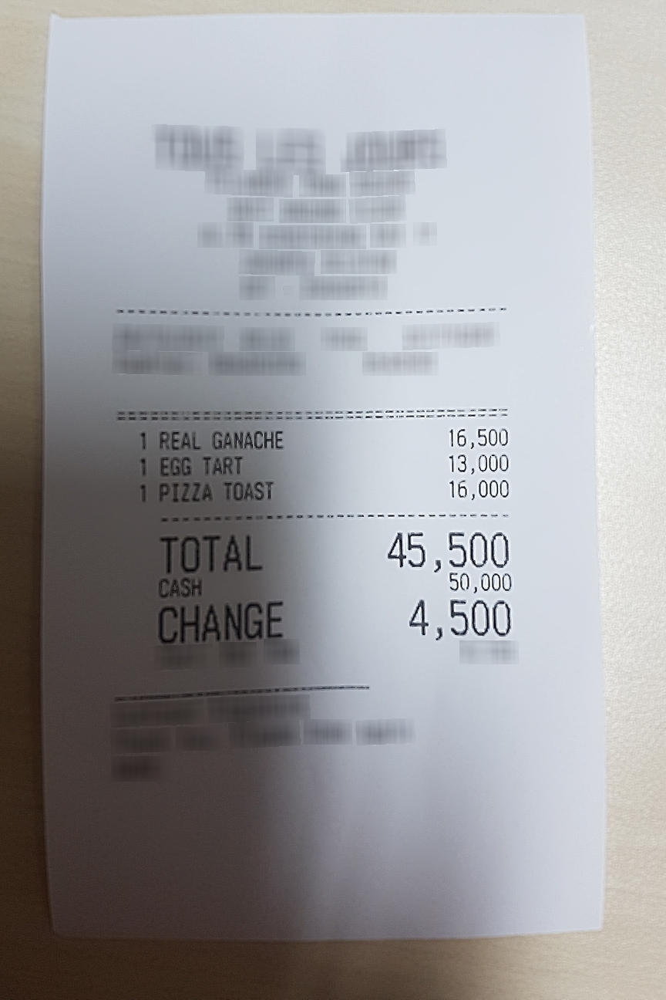

In [ ]:
model.eval()

sample = dataset['validation'][0]
pixel_values = processor(sample['image'], return_tensors="pt").pixel_values.to(model.device)

outputs = model.generate(
    pixel_values,
    decoder_input_ids=torch.tensor([[model.config.decoder_start_token_id]]).to(model.device),
    max_length=512,
    early_stopping=True,
    pad_token_id=processor.tokenizer.pad_token_id,
    eos_token_id=processor.tokenizer.eos_token_id,
)

result = processor.batch_decode(outputs)[0]
print(result)
print(sample['ground_truth'])
sample['image']

In [ ]:
for i in range(5):
    sample = dataset['validation'][i]
    pixel_values = processor(sample['image'], return_tensors="pt").pixel_values.to(model.device)

    outputs = model.generate(
        pixel_values,
        decoder_input_ids=torch.tensor([[model.config.decoder_start_token_id]]).to(model.device),
        max_length=512,
        early_stopping=True,
        pad_token_id=processor.tokenizer.pad_token_id,
        eos_token_id=processor.tokenizer.eos_token_id,
    )

    print(f"--- Sample {i} ---")
    print("Predicted:", processor.batch_decode(outputs)[0])
    print("Actual:   ", sample['ground_truth'])
    print()

--- Sample 0 ---
Predicted: <s> <s_menu><s_nm>REAL GANACHE</s_nm><s_cnt><unk></s_cnt><s_price>16,500</s_price><sep/> <s_nm>EGG TART</s_nm><s_cnt><unk></s_cnt><s_price>13,000</s_price><sep/> <s_nm>PIZZA TOAST</s_nm><s_cnt><unk></s_cnt><s_price>16,000</s_price></s_menu><s_total><s_total_price>45,500</s_total_price><s_cashprice>50,000</s_cashprice><s_changeprice>4,500</s_changeprice></s_total></s>
Actual:    {"gt_parse": {"menu": [{"nm": "REAL GANACHE", "cnt": "1", "price": "16,500"}, {"nm": "EGG TART", "cnt": "1", "price": "13,000"}, {"nm": "PIZZA TOAST", "cnt": "1", "price": "16,000"}], "total": {"total_price": "45,500", "cashprice": "50,000", "changeprice": "4,500"}}, "meta": {"version": "2.0.0", "split": "valid", "image_id": 0, "image_size": {"width": 864, "height": 1296}}, "valid_line": [{"words": [{"quad": {"x2": 194, "y3": 586, "x3": 194, "y4": 586, "x1": 176, "y1": 556, "x4": 176, "y2": 556}, "is_key": 0, "row_id": 2068522, "text": "1"}], "category": "menu.cnt", "group_id": 3, "su

In [ ]:
sample = train_dataset[0]
labels = sample['labels']
# find where the real content ends (before -100 padding starts)
real_tokens = labels[labels != -100]
print(processor.tokenizer.decode(real_tokens))

<s_menu><s_nm>Nasi Campur Bali</s_nm><s_cnt><unk> x</s_cnt><s_price>75,000</s_price><sep/> <s_nm>Bbk Bengil Nasi</s_nm><s_cnt><unk> x</s_cnt><s_price>125,000</s_price><sep/> <s_nm>MilkShake Starwb</s_nm><s_cnt><unk> x</s_cnt><s_price>37,000</s_price><sep/> <s_nm>Ice Lemon Tea</s_nm><s_cnt><unk> x</s_cnt><s_price>24,000</s_price><sep/> <s_nm>Nasi Ayam Dewata</s_nm><s_cnt><unk> x</s_cnt><s_price>70,000</s_price><sep/> <s_nm>Free Ice Tea</s_nm><s_cnt>3 x</s_cnt><s_price>0</s_price><sep/> <s_nm>Organic Green Sa</s_nm><s_cnt><unk> x</s_cnt><s_price>65,000</s_price><sep/> <s_nm>Ice Tea</s_nm><s_cnt><unk> x</s_cnt><s_price>18,000</s_price><sep/> <s_nm>Ice Orange</s_nm><s_cnt><unk> x</s_cnt><s_price>29,000</s_price><sep/> <s_nm>Ayam Suir Bali</s_nm><s_cnt><unk> x</s_cnt><s_price>85,000</s_price><sep/> <s_nm>Tahu Goreng</s_nm><s_cnt>2 x</s_cnt><s_price>36,000</s_price><sep/> <s_nm>Tempe Goreng</s_nm><s_cnt>2 x</


In [ ]:
cnt_values = set()
for i in range(len(dataset['train'])):
    gt = json.loads(dataset['train'][i]['ground_truth'])
    menu = gt['gt_parse'].get('menu', [])
    if isinstance(menu, dict):
        menu = [menu]
    for item in menu:
        if 'cnt' in item:
            val = item['cnt']
            if isinstance(val, list):
                cnt_values.update(val)  # unpack the list instead of adding it whole
            else:
                cnt_values.add(val)

print(cnt_values)

{'2', '1 x', '0.512X', '10', '95', '80', '10X', '118', '4x', '48,540', '38,835', '0.09X', '1.0', 'x2', '0.282X', 'x4', '3 X', '60', '11', '4X', '0.482X', '0,896X', '0.308X', '1,000', '2X', 'TRIPPLE CHEESE', '2.0', '*2', '*1 Pc', '8', '0.198X', '1.00xITEMS', '1x', '0.074X', '3.000x', '2 X', '10x', '1.00x', '1 X', '5', '7', '4', '3.00', 'x 1', '2x', '3 x', 'x1', '0.264X', '3x', '*1', '3X', '22.10', '1', '1.00.', '5X', '0.064X', '0,292X', '2.00', '2 x', '6', '133', 'x3', '0.354X', '1X', '1.00', '10.00', '3', '13', '202', '15x', '*4 Pcs'}


In [ ]:
for val in list(cnt_values)[:10]:
    tokens = processor.tokenizer.tokenize(val)
    print(f"{val!r} -> {tokens}")

'2' -> ['▁2']
'1 x' -> ['▁1', '▁x']
'0.512X' -> ['▁0.5', '12', 'X']
'10' -> ['▁10']
'95' -> ['▁95']
'80' -> ['▁80']
'10X' -> ['▁10', 'X']
'118' -> ['▁118']
'4x' -> ['▁4', 'x']
'48,540' -> ['▁4', '8,5', '40']


In [ ]:
import os
print(os.path.exists("/content/drive/MyDrive"))

True


In [ ]:
import os

all_items = os.listdir("/content/drive/MyDrive")
donut_related = [item for item in all_items if "donut" in item.lower()]
print(donut_related)

['donut_cord_checkpoints']


In [ ]:
import os

folder = "/content/drive/MyDrive/donut_cord_checkpoints"
checkpoints = os.listdir(folder)
print(checkpoints)

for ckpt in checkpoints:
    path = os.path.join(folder, ckpt)
    mtime = os.path.getmtime(path)
    import datetime
    print(ckpt, "->", datetime.datetime.fromtimestamp(mtime))

['checkpoint-900', 'checkpoint-1000', 'checkpoint-1100']
checkpoint-900 -> 2026-09-26 09:36:20
checkpoint-1000 -> 2026-09-26 09:37:33
checkpoint-1100 -> 2026-09-26 09:38:33


In [ ]:
print(os.path.exists("/content/drive/MyDrive/donut_cord_checkpoints"))

True


In [ ]:
import os
print(os.listdir("/content/drive/MyDrive/donut_cord_checkpoints/checkpoint-1100"))

['config.json', 'generation_config.json', 'model.safetensors']


In [ ]:
# trainer.train(resume_from_checkpoint="/content/drive/MyDrive/donut_cord_checkpoints/checkpoint-1000")

[transformers] There were missing keys in the checkpoint model loaded: ['decoder.lm_head.weight'].


Step,Training Loss
1010,0.090406
1020,0.043862
1030,0.038450
1040,0.050601
1050,0.100031
1060,0.077281
1070,0.049729
1080,0.057360
1090,0.061480
1100,0.034071


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Step,Training Loss
1010,0.090406
1020,0.043862
1030,0.038450
1040,0.050601
1050,0.100031
1060,0.077281
1070,0.049729
1080,0.057360
1090,0.061480
1100,0.034071


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

TrainOutput(global_step=4000, training_loss=0.020764650442637502, metrics={'train_runtime': 2548.8895, 'train_samples_per_second': 1.569, 'train_steps_per_second': 1.569, 'total_flos': 1.25076466040832e+19, 'train_loss': 0.020764650442637502, 'epoch': 5.0})

In [ ]:
# result = processor.batch_decode(outputs)[0]

# # clean up EOS/PAD tokens before parsing
# cleaned = result.replace(processor.tokenizer.eos_token, "").replace(processor.tokenizer.pad_token, "")

# # convert tag-tokens back into a proper nested dictionary
# parsed = processor.token2json(cleaned)

# import json
# print(json.dumps(parsed, indent=2, ensure_ascii=False))

In [ ]:
import os

save_dir = "/content/drive/MyDrive/donut_cord_final"
os.makedirs(save_dir, exist_ok=True)

model.save_pretrained(save_dir)
processor.save_pretrained(save_dir)

print("Saved. Files:", os.listdir(save_dir))

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Saved. Files: ['config.json', 'generation_config.json', 'model.safetensors', 'tokenizer_config.json', 'tokenizer.json', 'processor_config.json']


In [ ]:
sample = train_dataset[5]  # pick any training sample
labels = sample['labels']
real_tokens = labels[labels != -100]
decoded = processor.tokenizer.decode(real_tokens)
print(decoded)

<s_menu><s_nm>Lasagna</s_nm><s_cnt><unk></s_cnt><s_price>45,000</s_price><sep/> <s_nm>Spaghetti ChickPesto</s_nm><s_cnt><unk></s_cnt><s_price>55,000</s_price><sep/> <s_nm>BangBang Chick Wings</s_nm><s_cnt><unk></s_cnt><s_price>49,000</s_price><sep/> <s_nm>Iced Cappuccino</s_nm><s_cnt><unk></s_cnt><s_price>33,000</s_price><sep/> <s_nm>Gypsy Gelato Ice Tea</s_nm><s_cnt><unk></s_cnt><s_price>39,000</s_price></s_menu><s_sub_total><s_subtotal_price>221,000</s_subtotal_price><s_service_price>16,575</s_service_price><s_tax_price>23,758</s_tax_price></s_sub_total><s_total><s_total_price>261,333</s_total_price><s_total_etc>100,000</s_total_etc><s_creditcardprice>16<unk>,333</s_creditcardprice></s_total></s>


In [ ]:
sample = dataset['train'][5]
gt = json.loads(sample['ground_truth'])
menu = gt['gt_parse']['menu']
if isinstance(menu, dict):
    menu = [menu]

for item in menu:
    cnt_val = item.get('cnt', None)
    print(repr(cnt_val))  # repr() shows hidden/invisible characters explicitly

'1'
'1'
'1'
'1'
'1'


In [ ]:
print(processor.tokenizer.tokenize("<s_cnt>1</s_cnt>"))
print(processor.tokenizer.tokenize("<s_cnt> 1</s_cnt>"))

['▁<', 's', '_', 'c', 'nt', '>', '1', '</', 's', '_', 'c', 'nt', '>']
['▁<', 's', '_', 'c', 'nt', '>', '▁1', '</', 's', '_', 'c', 'nt', '>']


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

import os
print(os.path.exists("/content/drive/MyDrive/donut_cord_final"))

Mounted at /content/drive
True


In [ ]:
from transformers import DonutProcessor, VisionEncoderDecoderModel

processor = DonutProcessor.from_pretrained("/content/drive/MyDrive/donut_cord_final")
model = VisionEncoderDecoderModel.from_pretrained("/content/drive/MyDrive/donut_cord_final")

Loading weights:   0%|          | 0/483 [00:00<?, ?it/s]

In [ ]:
print(processor.tokenizer.tokenize("<s_cnt>1</s_cnt>"))

['▁<', 's', '_', 'c', 'nt', '>', '1', '</', 's', '_', 'c', 'nt', '>']


In [ ]:
ids = processor.tokenizer.encode("<s_cnt>1</s_cnt>", add_special_tokens=False)
print(ids)
print(processor.tokenizer.convert_ids_to_tokens(ids))

[41040, 46192, 41403, 28019, 47996, 34791, 3, 40598, 46192, 41403, 28019, 47996, 34791]
['▁<', 's', '_', 'c', 'nt', '>', '<unk>', '</', 's', '_', 'c', 'nt', '>']


In [ ]:
print(processor.tokenizer.convert_tokens_to_ids("<s_cnt>"))

3


In [ ]:
from transformers import DonutProcessor, VisionEncoderDecoderModel

test_processor = DonutProcessor.from_pretrained(save_dir)
test_model = VisionEncoderDecoderModel.from_pretrained(save_dir)

print("Vocab size matches:", len(test_processor.tokenizer) == test_model.decoder.get_output_embeddings().weight.shape[0])
print("decoder_start_token_id:", test_model.config.decoder_start_token_id)
print("pad_token_id:", test_model.config.pad_token_id)